In [1]:
import tensorflow as tf
tf.__version__

'2.9.0'

# Introduction to convolutional neural networks with tensorflow

Computer vision is a practice of writing algoritms which can discover patterns in visual data.

## Get the data

In [2]:
import zipfile

# Unzip the downloaded file
zip_ref = zipfile.ZipFile("pizza_steak.zip")
zip_ref.extractall()
zip_ref.close()

### Inspect the data

In [3]:
!ls pizza_steak

test  train


In [4]:
!ls pizza_steak/train/

pizza steak


In [5]:
!ls pizza_steak/train/steak

1000205.jpg 1647351.jpg 2238681.jpg 2824680.jpg 3375959.jpg 417368.jpg
100135.jpg  1650002.jpg 2238802.jpg 2825100.jpg 3381560.jpg 4176.jpg
101312.jpg  165639.jpg  2254705.jpg 2826987.jpg 3382936.jpg 42125.jpg
1021458.jpg 1658186.jpg 225990.jpg  2832499.jpg 3386119.jpg 421476.jpg
1032846.jpg 1658443.jpg 2260231.jpg 2832960.jpg 3388717.jpg 421561.jpg
10380.jpg   165964.jpg  2268692.jpg 285045.jpg  3389138.jpg 438871.jpg
1049459.jpg 167069.jpg  2271133.jpg 285147.jpg  3393547.jpg 43924.jpg
1053665.jpg 1675632.jpg 227576.jpg  2855315.jpg 3393688.jpg 440188.jpg
1068516.jpg 1678108.jpg 2283057.jpg 2856066.jpg 3396589.jpg 442757.jpg
1068975.jpg 168006.jpg  2286639.jpg 2859933.jpg 339891.jpg  443210.jpg
1081258.jpg 1682496.jpg 2287136.jpg 286219.jpg  3417789.jpg 444064.jpg
1090122.jpg 1684438.jpg 2291292.jpg 2862562.jpg 3425047.jpg 444709.jpg
1093966.jpg 168775.jpg  229323.jpg  2865730.jpg 3434983.jpg 447557.jpg
1098844.jpg 1697339.jpg 2300534.jpg 2878151.jpg 3435358.jpg 461187.jpg
1100074.jp

In [6]:
import os

# Walk through the file and list the number of files
for dirpath, dirnames, filenames in os.walk("pizza_steak"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")

There are 2 directories and 0 images in 'pizza_steak'
There are 2 directories and 0 images in 'pizza_steak/test'
There are 0 directories and 250 images in 'pizza_steak/test/steak'
There are 0 directories and 250 images in 'pizza_steak/test/pizza'
There are 2 directories and 0 images in 'pizza_steak/train'
There are 0 directories and 750 images in 'pizza_steak/train/steak'
There are 0 directories and 750 images in 'pizza_steak/train/pizza'


In [7]:
# Another way to find out how many images in a file
num_steak_images_train = len(os.listdir("pizza_steak/train/steak"))
num_steak_images_train

750

Visualise images

In [8]:
import pathlib
import numpy as np
data_dir = pathlib.Path("pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # Create a list of classnames from sub_directories
print(class_names)

['pizza' 'steak']


In [9]:
# Visualise images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir,target_class):
  # Setup target directory
  target_folder = target_dir+target_class

  #Get random image path
  random_image = random.sample(os.listdir(target_folder),1)
  print(random_image)

  #Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder+"/"+random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")
  plt.show()

  print(f"Image shape {img.shape}") # Shows the shape of the image

  return img


['3116018.jpg']


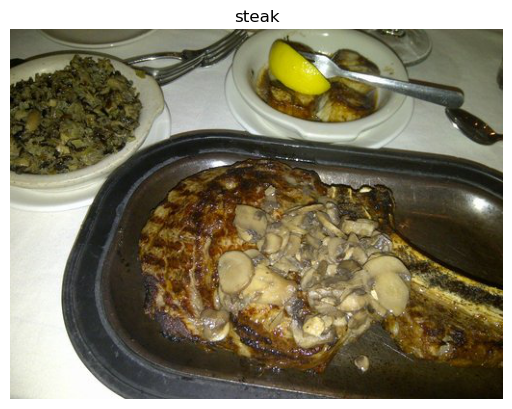

Image shape (384, 512, 3)
['2394465.jpg']


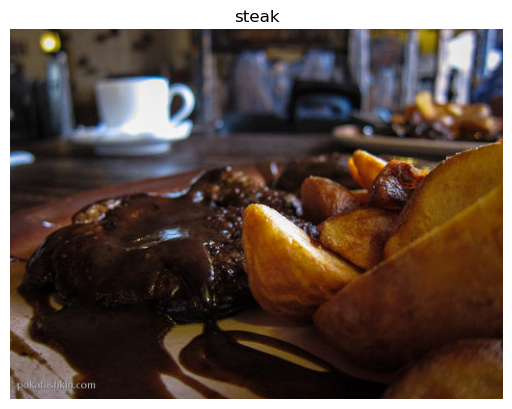

Image shape (384, 512, 3)
['3245533.jpg']


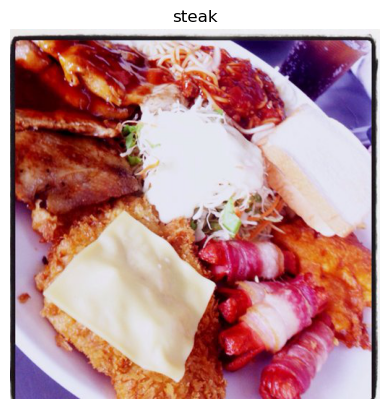

Image shape (512, 512, 3)
['1598885.jpg']


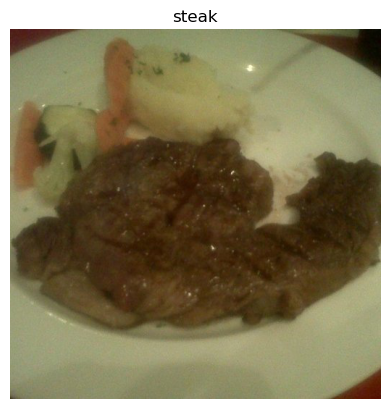

Image shape (511, 512, 3)
['1624747.jpg']


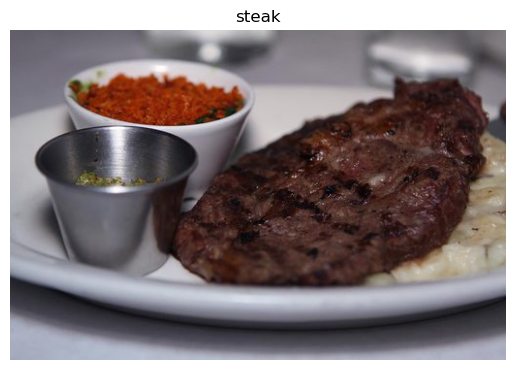

Image shape (341, 512, 3)
['2300534.jpg']


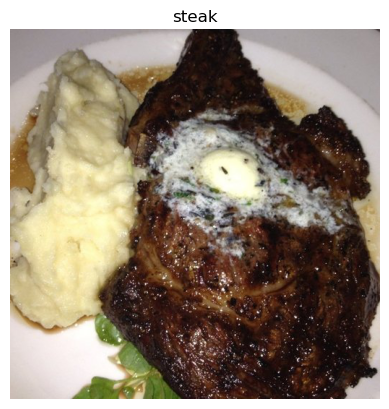

Image shape (512, 512, 3)
['126345.jpg']


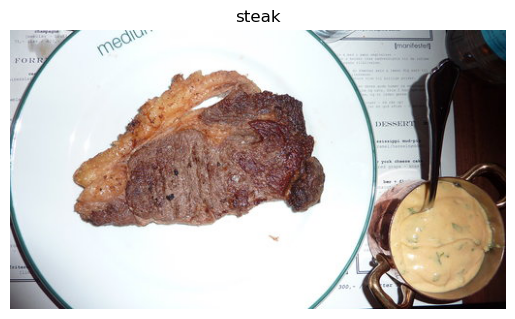

Image shape (288, 512, 3)
['3335013.jpg']


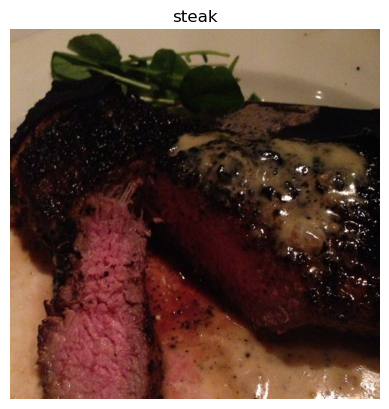

Image shape (512, 512, 3)
['1421393.jpg']


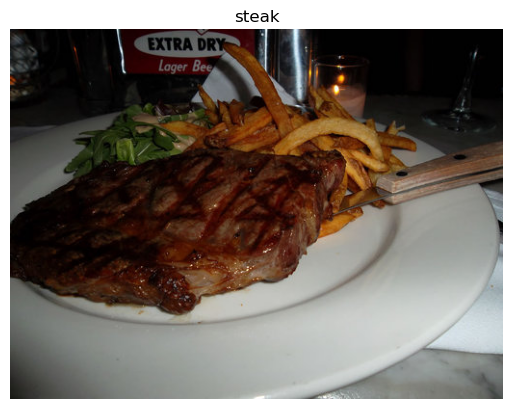

Image shape (384, 512, 3)
['1049459.jpg']


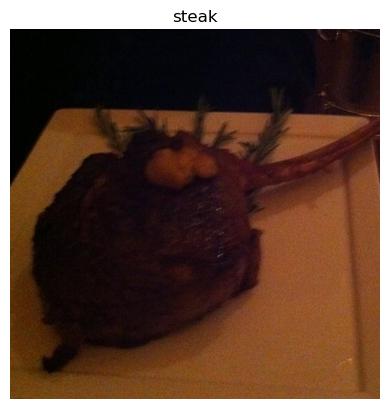

Image shape (512, 512, 3)


In [10]:
# View random image from training dataset
for i in range(10):
  img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="steak")

['1552253.jpg']


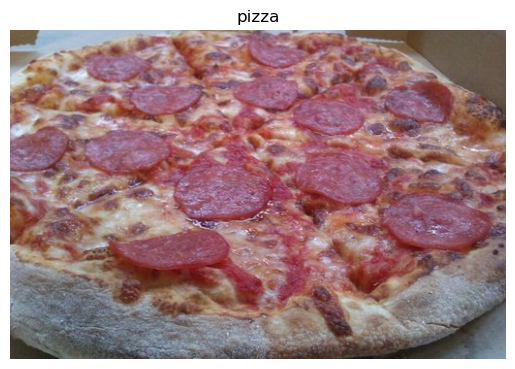

Image shape (340, 512, 3)
['2508157.jpg']


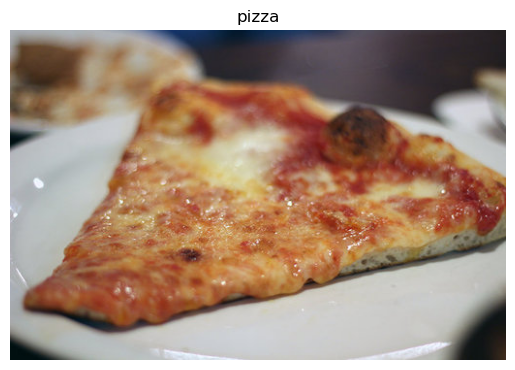

Image shape (341, 512, 3)
['1968947.jpg']


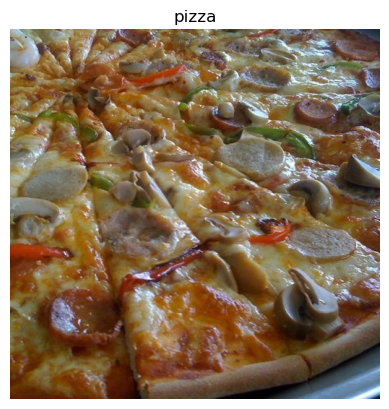

Image shape (512, 512, 3)
['300869.jpg']


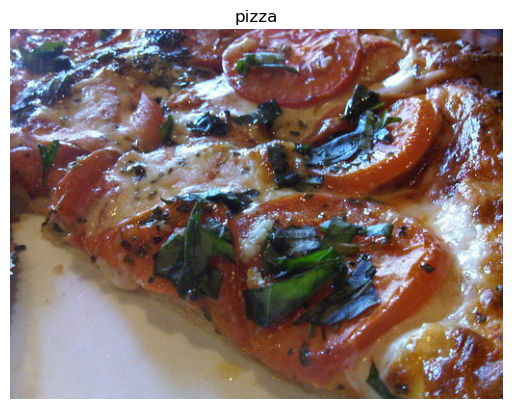

Image shape (384, 512, 3)
['370643.jpg']


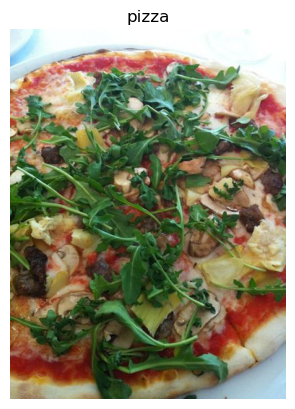

Image shape (512, 382, 3)
['221048.jpg']


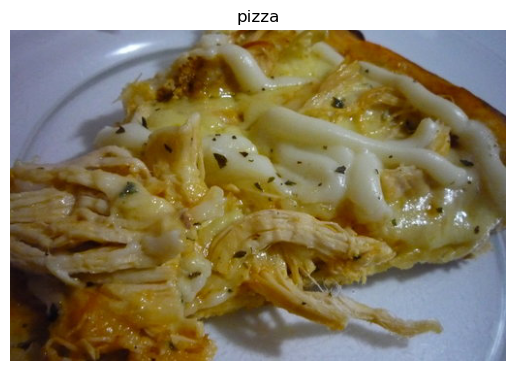

Image shape (342, 512, 3)
['1026922.jpg']


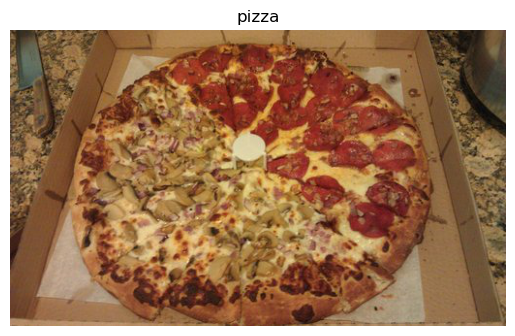

Image shape (306, 512, 3)
['704161.jpg']


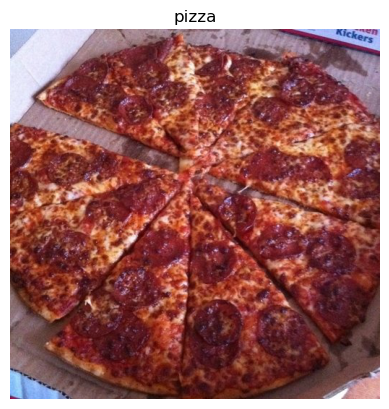

Image shape (512, 512, 3)
['253127.jpg']


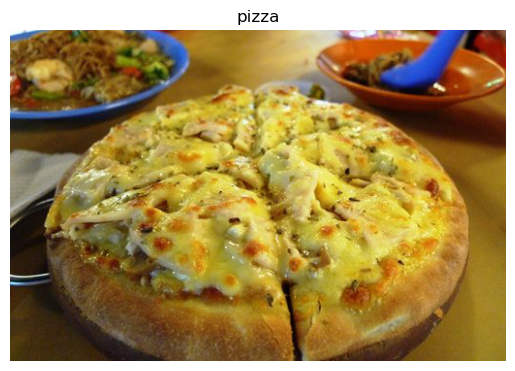

Image shape (342, 512, 3)
['132484.jpg']


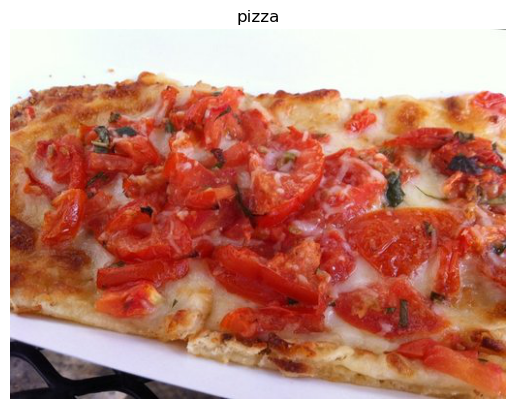

Image shape (382, 512, 3)


In [11]:
for i in range(10):
  img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="pizza")

In [12]:
img = tf.cast(tf.constant(img),dtype=tf.float32)
img

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2023-05-24 22:19:53.567033: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-05-24 22:19:53.567183: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


<tf.Tensor: shape=(382, 512, 3), dtype=float32, numpy=
array([[[250., 255., 248.],
        [250., 255., 248.],
        [250., 255., 248.],
        ...,
        [162., 167., 161.],
        [153., 158., 152.],
        [149., 154., 148.]],

       [[250., 255., 248.],
        [250., 255., 248.],
        [250., 255., 248.],
        ...,
        [244., 249., 243.],
        [242., 247., 241.],
        [241., 246., 240.]],

       [[250., 255., 248.],
        [250., 255., 248.],
        [250., 255., 248.],
        ...,
        [252., 255., 251.],
        [252., 255., 251.],
        [252., 255., 251.]],

       ...,

       [[ 20.,  10.,  18.],
        [ 20.,  13.,  21.],
        [ 22.,  15.,  23.],
        ...,
        [193., 113.,  64.],
        [195., 116.,  60.],
        [190., 111.,  54.]],

       [[ 24.,  17.,  24.],
        [ 25.,  18.,  26.],
        [ 25.,  18.,  26.],
        ...,
        [195., 121.,  72.],
        [199., 126.,  71.],
        [196., 124.,  65.]],

       [[ 28.,  2

In [13]:
img.shape

TensorShape([382, 512, 3])

In [14]:
# Normalize the data
img/255.

<tf.Tensor: shape=(382, 512, 3), dtype=float32, numpy=
array([[[0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        ...,
        [0.63529414, 0.654902  , 0.6313726 ],
        [0.6       , 0.61960787, 0.59607846],
        [0.58431375, 0.6039216 , 0.5803922 ]],

       [[0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        ...,
        [0.95686275, 0.9764706 , 0.9529412 ],
        [0.9490196 , 0.96862745, 0.94509804],
        [0.94509804, 0.9647059 , 0.9411765 ]],

       [[0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        [0.98039216, 1.        , 0.972549  ],
        ...,
        [0.9882353 , 1.        , 0.9843137 ],
        [0.9882353 , 1.        , 0.9843137 ],
        [0.9882353 , 1.        , 0.9843137 ]],

       ...,

       [[0.07843138, 0.03921569, 0.07058824],
        [0.07

## An end-to-end exsmple

build a convolutional neural network

* Load image
* Pre-process images
* Build CNN
* Compile CNN
* Fit CNN

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir="pizza_steak/train/"
test_dir="pizza_steak/test/"

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               seed=42)
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             class_mode="binary",
                                             seed=42)

model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)                                                                                                                                     
])

model_1.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5


2023-05-24 22:19:54.205788: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-05-24 22:19:54.501291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6204 - accuracy: 0.6127

2023-05-24 22:20:00.651542: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 8s 146ms/step - loss: 0.6204 - accuracy: 0.6127 - val_loss: 0.4134 - val_accuracy: 0.8300
Epoch 2/5
47/47 [==============================] - 6s 131ms/step - loss: 0.4369 - accuracy: 0.7887 - val_loss: 0.3536 - val_accuracy: 0.8660
Epoch 3/5
47/47 [==============================] - 6s 123ms/step - loss: 0.4008 - accuracy: 0.8147 - val_loss: 0.4126 - val_accuracy: 0.8040
Epoch 4/5
47/47 [==============================] - 6s 126ms/step - loss: 0.3666 - accuracy: 0.8427 - val_loss: 0.3301 - val_accuracy: 0.8760
Epoch 5/5
47/47 [==============================] - 6s 135ms/step - loss: 0.3275 - accuracy: 0.8660 - val_loss: 0.3667 - val_accuracy: 0.8380


In [16]:
# model summary
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

## Use the same model as before

In [17]:
# Set random seed
tf.random.set_seed(42)

# Create a model to replicate the TensorFlow Playground model
model_2 = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(1, activation=tf.keras.activations.sigmoid)
])

# Compile the model
model_2.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Fit the model
history_2 = model_2.fit(train_data, 
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data, 
                        validation_steps=len(test_data))

Epoch 1/5


2023-05-24 22:20:27.061764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.8176 - accuracy: 0.5073

2023-05-24 22:20:30.325622: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 4s 88ms/step - loss: 0.8176 - accuracy: 0.5073 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 4s 87ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 4s 88ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 4s 87ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 4s 86ms/step - loss: 0.6932 - accuracy: 0.4907 - val_loss: 0.6931 - val_accuracy: 0.5000


In [18]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 4)                 602116    
                                                                 
 dense_2 (Dense)             (None, 4)                 20        
                                                                 
 dense_3 (Dense)             (None, 1)                 5         
                                                                 
Total params: 602,141
Trainable params: 602,141
Non-trainable params: 0
_________________________________________________________________


In [19]:
tf.random.set_seed(42)
model_3 = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_3.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=['accuracy'])
history_3 = model_3.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-05-24 22:20:48.262843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 3.7695 - accuracy: 0.6500

2023-05-24 22:20:51.603271: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 5s 90ms/step - loss: 3.7695 - accuracy: 0.6500 - val_loss: 0.6365 - val_accuracy: 0.7200
Epoch 2/5
47/47 [==============================] - 4s 85ms/step - loss: 1.3437 - accuracy: 0.6893 - val_loss: 0.4838 - val_accuracy: 0.7820
Epoch 3/5
47/47 [==============================] - 4s 85ms/step - loss: 0.8952 - accuracy: 0.6927 - val_loss: 0.9845 - val_accuracy: 0.6780
Epoch 4/5
47/47 [==============================] - 4s 86ms/step - loss: 0.7780 - accuracy: 0.7073 - val_loss: 0.7101 - val_accuracy: 0.6720
Epoch 5/5
47/47 [==============================] - 4s 85ms/step - loss: 0.4625 - accuracy: 0.8007 - val_loss: 0.4492 - val_accuracy: 0.7800


In [20]:
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               15052900  
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 100)               10100     
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


### Summary:
Regular neural network models are good for any tensors to be trained, but with computer vision, its better to use CNN as no other method of neural network can match its potential

['332557.jpg']


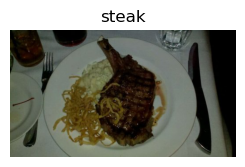

Image shape (289, 512, 3)
['1524599.jpg']


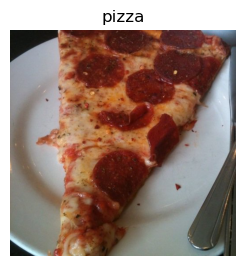

Image shape (512, 510, 3)


In [21]:
# Visualize the data
plt.figure()
plt.subplot(1,2,1)
steak_image = view_random_image("pizza_steak/train/","steak")
plt.subplot(1,2,2)
pizza_image= view_random_image("pizza_steak/train/","pizza")

### Preprocess the data

In [22]:
# Define directory dataset paths
train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test/"

Turn the data into batches

In [23]:
# Create train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_data_gen=ImageDataGenerator(rescale=1./255)

In [24]:
# Load images from directories and turn them into batches
train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               batch_size=32)

test_data = test_data_gen.flow_from_directory(directory=test_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [25]:
# Get samples of train data batch
images, labels = train_data.next()  # get the next batch of images/lables
len(images),len(labels)

(32, 32)

In [26]:
# Get the firsy two images
images[:2],images[0].shape

(array([[[[0.47058827, 0.40784317, 0.34509805],
          [0.4784314 , 0.427451  , 0.3647059 ],
          [0.48627454, 0.43529415, 0.37254903],
          ...,
          [0.8313726 , 0.70980394, 0.48627454],
          [0.8431373 , 0.73333335, 0.5372549 ],
          [0.87843144, 0.7725491 , 0.5882353 ]],
 
         [[0.50980395, 0.427451  , 0.36078432],
          [0.5058824 , 0.42352945, 0.35686275],
          [0.5137255 , 0.4431373 , 0.3647059 ],
          ...,
          [0.82745105, 0.7058824 , 0.48235297],
          [0.82745105, 0.70980394, 0.5058824 ],
          [0.8431373 , 0.73333335, 0.5372549 ]],
 
         [[0.5254902 , 0.427451  , 0.34901962],
          [0.5372549 , 0.43921572, 0.36078432],
          [0.5372549 , 0.45098042, 0.36078432],
          ...,
          [0.82745105, 0.7019608 , 0.4784314 ],
          [0.82745105, 0.7058824 , 0.49411768],
          [0.8352942 , 0.7176471 , 0.5137255 ]],
 
         ...,
 
         [[0.77647066, 0.5647059 , 0.2901961 ],
          [0.78039

In [27]:
labels

array([1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1., 0., 1.],
      dtype=float32)

(<matplotlib.image.AxesImage at 0x1490cc280>, 1.0)

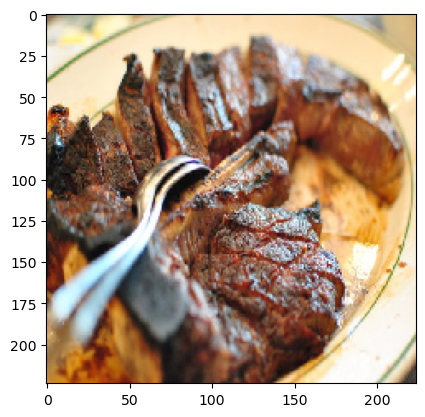

In [28]:
plt.imshow(images[0]),labels[0]

### Create a model

Start with baseline

> In deep learning there is almost infinite architectures you could create, one of best way to start is to start simple and see if it works and increase complexity if it works

In [29]:
# 3-Layers Convolutional neural network
model_4 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           padding="valid",
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

In [30]:
# Compile the model
model_4.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy","mae"])

In [31]:
# Fit the model
history_4 = model_4.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data = test_data,
            validation_steps = len(test_data))

Epoch 1/5


2023-05-24 22:21:10.189064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.9807 - accuracy: 0.6587 - mae: 0.4085

2023-05-24 22:21:16.670691: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 8s 157ms/step - loss: 0.9807 - accuracy: 0.6587 - mae: 0.4085 - val_loss: 0.4911 - val_accuracy: 0.7860 - val_mae: 0.3584
Epoch 2/5
47/47 [==============================] - 7s 143ms/step - loss: 0.4515 - accuracy: 0.7960 - mae: 0.2950 - val_loss: 0.4279 - val_accuracy: 0.7980 - val_mae: 0.2814
Epoch 3/5
47/47 [==============================] - 7s 144ms/step - loss: 0.3733 - accuracy: 0.8440 - mae: 0.2507 - val_loss: 0.3895 - val_accuracy: 0.8380 - val_mae: 0.2634
Epoch 4/5
47/47 [==============================] - 7s 144ms/step - loss: 0.2452 - accuracy: 0.9140 - mae: 0.1719 - val_loss: 0.4736 - val_accuracy: 0.7940 - val_mae: 0.2542
Epoch 5/5
47/47 [==============================] - 7s 146ms/step - loss: 0.1052 - accuracy: 0.9693 - mae: 0.0776 - val_loss: 0.5610 - val_accuracy: 0.7940 - val_mae: 0.2496


### Evaluate the model

<AxesSubplot: >

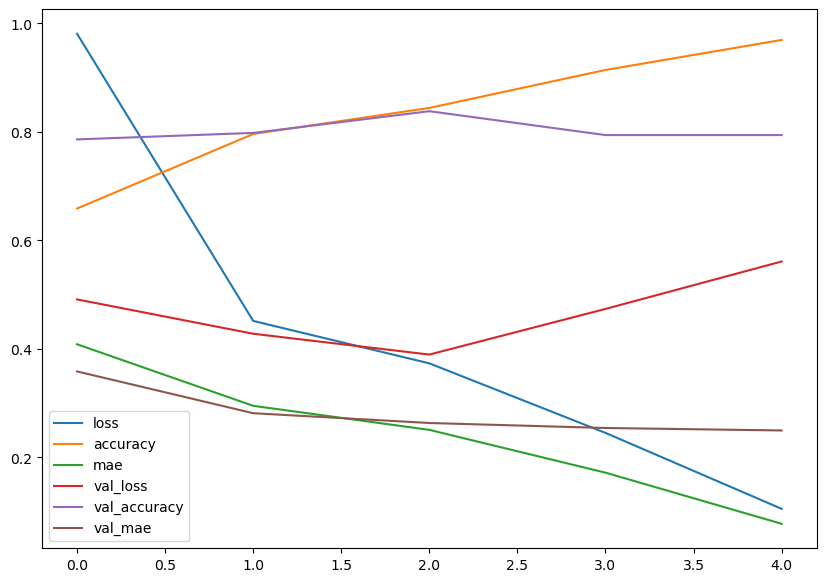

In [32]:
import pandas as pd
pd.DataFrame(history_4.history).plot(figsize=(10,7))

In [33]:
# Plot the curves seperately
def plot_loss_curves(history):
    
    # returns seperate loss curves
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

    accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]

    epochs = range(len(history.history["loss"]))

    #plot loss:
    plt.figure(figsize=(15,8))
    plt.subplot(1,2,1)
    plt.plot(epochs,loss,label="training_loss")
    plt.plot(epochs,val_loss,label="val_loss")
    plt.title("loss")
    plt.xlabel("epochs")
    plt.legend()
    #plt.show()

    #Plot the accuracy
    plt.subplot(1,2,2)
    plt.plot(epochs,accuracy,label="training_accuracy")
    plt.plot(epochs,val_accuracy,label="val_accuracy")
    plt.title("accuracy")
    plt.xlabel("epochs")
    plt.legend()
    #plt.show()

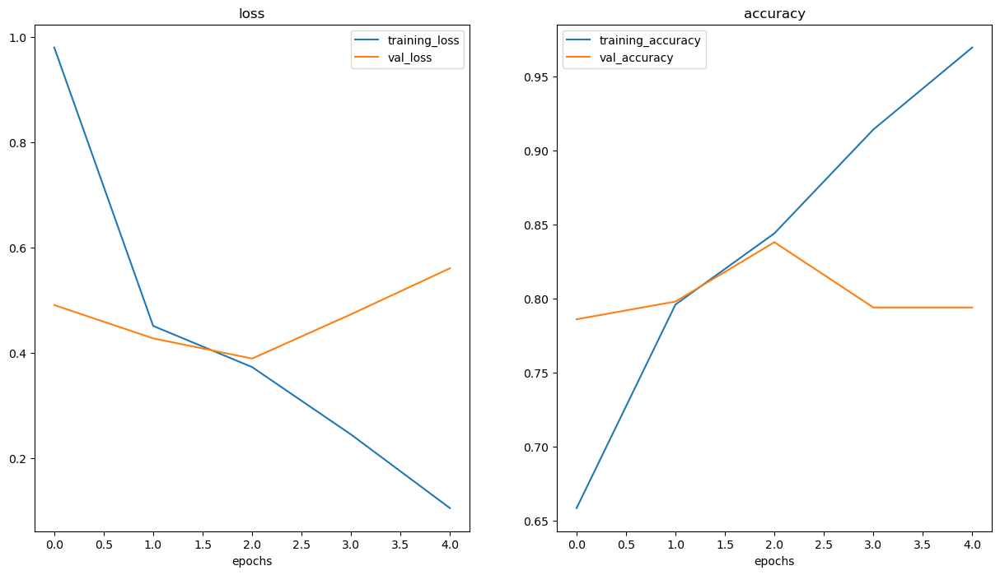

In [34]:
plot_loss_curves(history_4)

### Ways to reduce overfitting
* increase the number of Conv2D layers
* Increase the number of Conv2D filters
* Add another dense layer to the output of our flattened layer

* Add data augmentation
* Add regularization layers(such as MaxPool2D)
* Add more data

In [35]:
# Create a model
model_5 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
# Compile the model
model_5.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
history_5 = model_5.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/10


2023-05-24 22:21:46.109710: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.5880 - accuracy: 0.6927

2023-05-24 22:21:49.989709: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 5s 101ms/step - loss: 0.5880 - accuracy: 0.6927 - val_loss: 0.4708 - val_accuracy: 0.8040
Epoch 2/10
47/47 [==============================] - 5s 97ms/step - loss: 0.4871 - accuracy: 0.7847 - val_loss: 0.3978 - val_accuracy: 0.8340
Epoch 3/10
47/47 [==============================] - 5s 109ms/step - loss: 0.4369 - accuracy: 0.8060 - val_loss: 0.3676 - val_accuracy: 0.8440
Epoch 4/10
47/47 [==============================] - 5s 107ms/step - loss: 0.4231 - accuracy: 0.8133 - val_loss: 0.3636 - val_accuracy: 0.8420
Epoch 5/10
47/47 [==============================] - 5s 109ms/step - loss: 0.4052 - accuracy: 0.8227 - val_loss: 0.3391 - val_accuracy: 0.8600
Epoch 6/10
47/47 [==============================] - 6s 119ms/step - loss: 0.3697 - accuracy: 0.8373 - val_loss: 0.3172 - val_accuracy: 0.8640
Epoch 7/10
47/47 [==============================] - 5s 115ms/step - loss: 0.3583 - accuracy: 0.8507 - val_loss: 0.4244 - val_accuracy: 0.7860
Epoch 8/10
47/47 [

In [36]:
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_3 (Flatten)         (None, 475240)            0         
                                                                 
 dense_8 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [37]:
model_5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 10)      

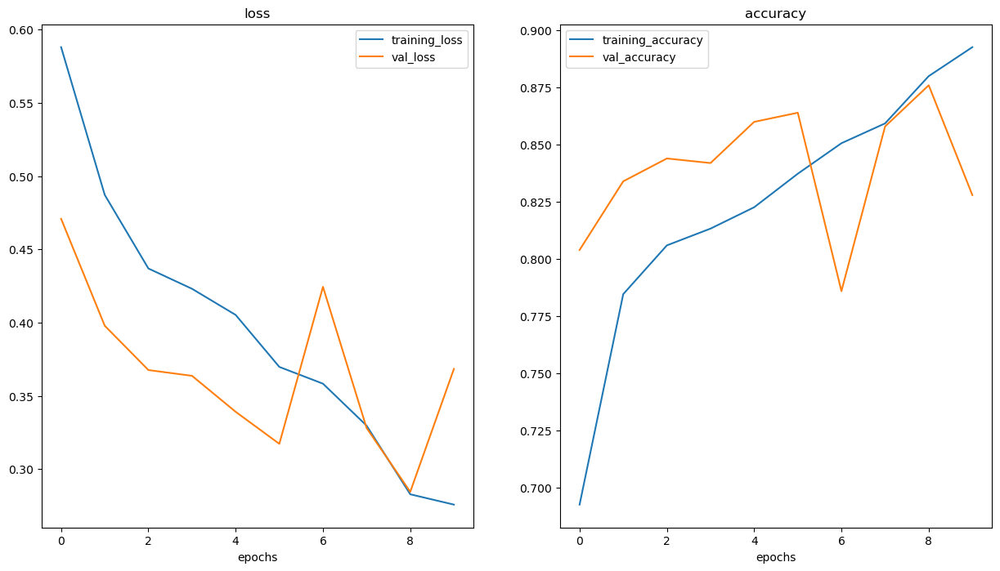

In [38]:
plot_loss_curves(history_5)

### Finding data augmentation

* Altering data leading it to have more diversity and stuff

In [39]:
# Create imageDataGenerator trainig instances with data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.6,
                                             shear_range=0.8,
                                             zoom_range=0.65,
                                             width_shift_range=0.5,
                                             height_shift_range=0.5,
                                             horizontal_flip=True)


# Create ImageDaagenerator without data augmentation
train_datagen = ImageDataGenerator(rescale=1./255)

# Creating ImageDataGenerator without data augmentation for the test dataset
test_datagen = ImageDataGenerator(rescale=1./255)

In [40]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                         batch_size=64,
                                                         target_size=(224,224),
                                                         seed=42,
                                                         class_mode="binary",
                                                         shuffle=False)

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=64,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=False)

test_data = test_datagen.flow_from_directory(test_dir,
                                            batch_size=64,
                                            target_size=(224,224),
                                            seed=42,
                                            class_mode="binary")

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [41]:
# Get the sample data batches
images, labels = train_data.next()
augmented_images, augmented_labels = train_data_augmented.next() # lables arent augmented, only data

Random number :  26


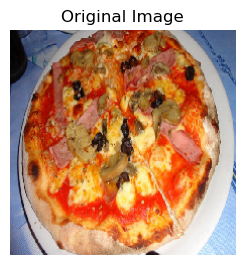

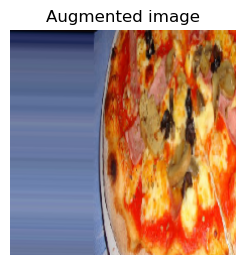

In [42]:
# Show original image and augmented image
import random
tf.random.set_seed(42)
random_number = random.randint(0,32)
"""print("Random number : ",random_number)
print("Original image\n")
plt.imshow(images[random_number])
plt.axis(False)
plt.figure()
print("Augmented image\n")
plt.imshow(augmented_images[random_number])
plt.axis(False)"""
print("Random number : ",random_number)
ax=plt.subplot(1,2,1)
plt.imshow(images[random_number])
plt.axis(False)
plt.title("Original Image")
plt.show()
ax = plt.subplot(1,2,2)
plt.imshow(augmented_images[random_number])
plt.axis(False)
plt.title("Augmented image")
plt.show()


In [43]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                         batch_size=32,
                                                         target_size=(224,224),
                                                         seed=42,
                                                         class_mode="binary",
                                                         shuffle=False)

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=False)

test_data = test_datagen.flow_from_directory(test_dir,
                                            batch_size=64,
                                            target_size=(224,224),
                                            seed=42,
                                            class_mode="binary")
model_6 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_6.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                   optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                   metrics=["accuracy"])
hisotry_6_augmented=model_6.fit(train_data_augmented,
                                epochs=10,
                                steps_per_epoch=len(train_data_augmented),
                                validation_data= test_data,
                                validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-05-24 22:22:40.395298: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6971 - accuracy: 0.4573

2023-05-24 22:22:54.293978: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 15s 316ms/step - loss: 0.6971 - accuracy: 0.4573 - val_loss: 0.6914 - val_accuracy: 0.5820
Epoch 2/10
47/47 [==============================] - 15s 307ms/step - loss: 0.6936 - accuracy: 0.4747 - val_loss: 0.6915 - val_accuracy: 0.5220
Epoch 3/10
47/47 [==============================] - 14s 301ms/step - loss: 0.6950 - accuracy: 0.4833 - val_loss: 0.6916 - val_accuracy: 0.6040
Epoch 4/10
47/47 [==============================] - 16s 332ms/step - loss: 0.6932 - accuracy: 0.4913 - val_loss: 0.6902 - val_accuracy: 0.6180
Epoch 5/10
47/47 [==============================] - 16s 344ms/step - loss: 0.6936 - accuracy: 0.4887 - val_loss: 0.6899 - val_accuracy: 0.5420
Epoch 6/10
47/47 [==============================] - 15s 317ms/step - loss: 0.6947 - accuracy: 0.4973 - val_loss: 0.6891 - val_accuracy: 0.5860
Epoch 7/10
47/47 [==============================] - 15s 309ms/step - loss: 0.6917 - accuracy: 0.5153 - val_loss: 0.6661 - val_accuracy: 0.5340
Epoch 8/10

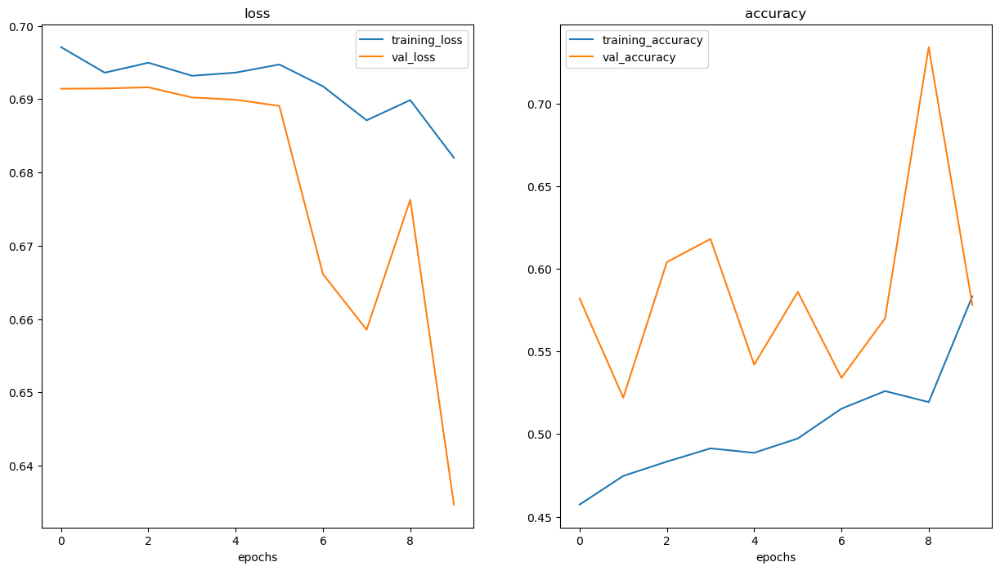

In [44]:
# Check the model's training curves
plot_loss_curves(hisotry_6_augmented)

In [45]:
# Allow shuffling of data
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=32,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
model_7 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_7.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
history_7_augmented = model_7.fit(train_data_augmented,
                                  epochs=10,
                                  steps_per_epoch=len(train_data_augmented),
                                  validation_data=test_data,
                                  validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Epoch 1/10


2023-05-24 22:25:08.998603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6829 - accuracy: 0.5367

2023-05-24 22:25:21.694757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 14s 291ms/step - loss: 0.6829 - accuracy: 0.5367 - val_loss: 0.6197 - val_accuracy: 0.6840
Epoch 2/10
47/47 [==============================] - 14s 289ms/step - loss: 0.6545 - accuracy: 0.6193 - val_loss: 0.5462 - val_accuracy: 0.7620
Epoch 3/10
47/47 [==============================] - 14s 290ms/step - loss: 0.5936 - accuracy: 0.6760 - val_loss: 0.4846 - val_accuracy: 0.7540
Epoch 4/10
47/47 [==============================] - 13s 286ms/step - loss: 0.5836 - accuracy: 0.7127 - val_loss: 0.4040 - val_accuracy: 0.8320
Epoch 5/10
47/47 [==============================] - 14s 288ms/step - loss: 0.5690 - accuracy: 0.7087 - val_loss: 0.3877 - val_accuracy: 0.8240
Epoch 6/10
47/47 [==============================] - 14s 290ms/step - loss: 0.5750 - accuracy: 0.7053 - val_loss: 0.3753 - val_accuracy: 0.8500
Epoch 7/10
47/47 [==============================] - 13s 285ms/step - loss: 0.5482 - accuracy: 0.7260 - val_loss: 0.3608 - val_accuracy: 0.8680
Epoch 8/10

### Improve the model

* Increase the number of layers
* Increase the number of filters in each convolutional layer
* Train for longer
* Find the ideal learning rate
* Get more data
* Use transfer learning

In [46]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=32,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             seed=42,
                                             class_mode="binary",
                                             shuffle=True)
model_8 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_8.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])
history_8_augmented=model_8.fit(train_data_augmented,
                                epochs=10,
                                steps_per_epoch=len(train_data_augmented),
                                validation_data=test_data,
                                validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-05-24 22:27:26.509743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6934 - accuracy: 0.4853

2023-05-24 22:27:40.149904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 15s 308ms/step - loss: 0.6934 - accuracy: 0.4853 - val_loss: 0.6933 - val_accuracy: 0.4800
Epoch 2/10
47/47 [==============================] - 15s 315ms/step - loss: 0.6925 - accuracy: 0.5160 - val_loss: 0.6899 - val_accuracy: 0.6340
Epoch 3/10
47/47 [==============================] - 16s 348ms/step - loss: 0.6817 - accuracy: 0.5773 - val_loss: 0.6594 - val_accuracy: 0.5860
Epoch 4/10
47/47 [==============================] - 16s 341ms/step - loss: 0.6316 - accuracy: 0.6340 - val_loss: 0.6152 - val_accuracy: 0.6560
Epoch 5/10
47/47 [==============================] - 16s 343ms/step - loss: 0.6035 - accuracy: 0.6940 - val_loss: 0.5032 - val_accuracy: 0.8160
Epoch 6/10
47/47 [==============================] - 16s 346ms/step - loss: 0.5693 - accuracy: 0.7120 - val_loss: 0.4102 - val_accuracy: 0.8400
Epoch 7/10
47/47 [==============================] - 17s 349ms/step - loss: 0.5475 - accuracy: 0.7253 - val_loss: 0.3576 - val_accuracy: 0.8640
Epoch 8/10

In [47]:
tf.random.set_seed(42)

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.8,
                                             zoom_range=0.9,
                                             width_shift_range=0.65,
                                             height_shift_range=0.5,
                                             horizontal_flip=True)
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test/"

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=64,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224),
                                               batch_size=64,
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=64,
                                             class_mode="binary",
                                             seed=42,
                                             shuffle=True)

model_9_augmented = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_9_augmented.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])

history_9_augmented = model_9_augmented.fit(train_data_augmented,
                                  epochs=10,
                                  steps_per_epoch=len(train_data_augmented),
                                  validation_data=test_data,
                                  validation_steps=len(test_data))

model_9 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_9.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])

history_9 = model_9.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-05-24 22:30:14.598674: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - ETA: 0s - loss: 0.6811 - accuracy: 0.5593

2023-05-24 22:30:35.593501: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - 24s 933ms/step - loss: 0.6811 - accuracy: 0.5593 - val_loss: 0.6325 - val_accuracy: 0.6260
Epoch 2/10
24/24 [==============================] - 21s 845ms/step - loss: 0.6475 - accuracy: 0.6393 - val_loss: 0.6136 - val_accuracy: 0.6440
Epoch 3/10
24/24 [==============================] - 20s 795ms/step - loss: 0.6227 - accuracy: 0.6567 - val_loss: 0.5925 - val_accuracy: 0.6720
Epoch 4/10
24/24 [==============================] - 20s 810ms/step - loss: 0.6327 - accuracy: 0.6600 - val_loss: 0.5734 - val_accuracy: 0.7100
Epoch 5/10
24/24 [==============================] - 20s 823ms/step - loss: 0.6140 - accuracy: 0.6647 - val_loss: 0.5900 - val_accuracy: 0.6860
Epoch 6/10
24/24 [==============================] - 19s 787ms/step - loss: 0.5927 - accuracy: 0.6853 - val_loss: 0.5564 - val_accuracy: 0.7200
Epoch 7/10
24/24 [==============================] - 20s 824ms/step - loss: 0.5708 - accuracy: 0.7080 - val_loss: 0.4351 - val_accuracy: 0.7920
Epoch 8/10

2023-05-24 22:33:39.889034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - ETA: 0s - loss: 0.6756 - accuracy: 0.6220

2023-05-24 22:33:52.262537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - 15s 570ms/step - loss: 0.6756 - accuracy: 0.6220 - val_loss: 0.5453 - val_accuracy: 0.7820
Epoch 2/10
24/24 [==============================] - 13s 547ms/step - loss: 0.5073 - accuracy: 0.7760 - val_loss: 0.4386 - val_accuracy: 0.8040
Epoch 3/10
24/24 [==============================] - 14s 559ms/step - loss: 0.4730 - accuracy: 0.7900 - val_loss: 0.4438 - val_accuracy: 0.8240
Epoch 4/10
24/24 [==============================] - 14s 561ms/step - loss: 0.4515 - accuracy: 0.8107 - val_loss: 0.3921 - val_accuracy: 0.8520
Epoch 5/10
24/24 [==============================] - 14s 563ms/step - loss: 0.4413 - accuracy: 0.8133 - val_loss: 0.3837 - val_accuracy: 0.8560
Epoch 6/10
24/24 [==============================] - 14s 574ms/step - loss: 0.4247 - accuracy: 0.8233 - val_loss: 0.3631 - val_accuracy: 0.8680
Epoch 7/10
24/24 [==============================] - 14s 564ms/step - loss: 0.3945 - accuracy: 0.8373 - val_loss: 0.3208 - val_accuracy: 0.8820
Epoch 8/10

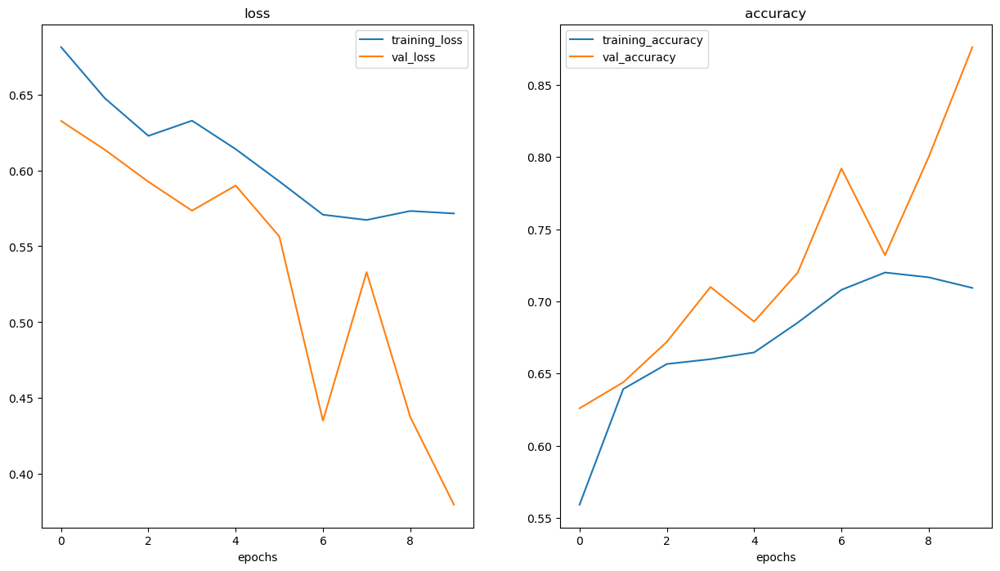

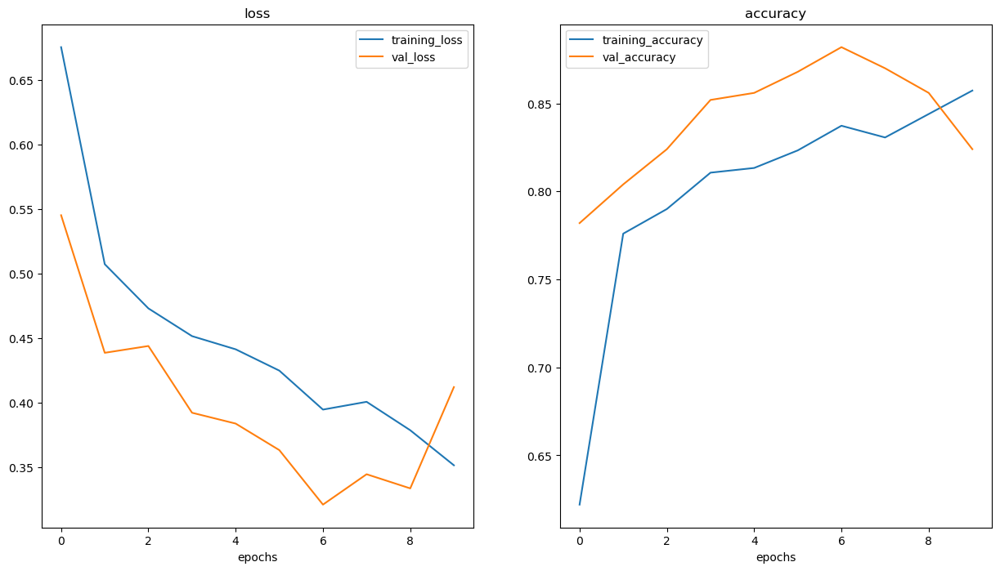

In [48]:
plot_loss_curves(history_9_augmented)
plot_loss_curves(history_9)

In [49]:
# practice the above model again
tf.random.set_seed(42)

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test"

train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224),
                                               seed=42,
                                               batch_size=32,
                                               shuffle=True,
                                               class_mode="binary")
test_data = test_datagen.flow_from_directory(test_dir,
                                               target_size=(224,224),
                                               seed=42,
                                               batch_size=32,
                                               shuffle=True,
                                               class_mode="binary")

model_practice = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_practice.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                       optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                       metrics=['mae','accuracy'])
history_practive = model_practice.fit(train_data,
                                      epochs=10,
                                      steps_per_epoch=len(train_data),
                                      validation_data=test_data,
                                      validation_steps=len(test_data))


Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-05-24 22:35:59.985577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6582 - mae: 0.4726 - accuracy: 0.5967

2023-05-24 22:36:07.713295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 10s 190ms/step - loss: 0.6582 - mae: 0.4726 - accuracy: 0.5967 - val_loss: 0.5979 - val_mae: 0.3993 - val_accuracy: 0.6440
Epoch 2/10
47/47 [==============================] - 9s 196ms/step - loss: 0.5394 - mae: 0.3622 - accuracy: 0.7427 - val_loss: 0.4452 - val_mae: 0.3117 - val_accuracy: 0.8200
Epoch 3/10
47/47 [==============================] - 9s 195ms/step - loss: 0.4419 - mae: 0.2852 - accuracy: 0.7973 - val_loss: 0.5726 - val_mae: 0.3274 - val_accuracy: 0.6880
Epoch 4/10
47/47 [==============================] - 9s 192ms/step - loss: 0.4498 - mae: 0.2893 - accuracy: 0.8073 - val_loss: 0.4019 - val_mae: 0.2841 - val_accuracy: 0.8120
Epoch 5/10
47/47 [==============================] - 9s 191ms/step - loss: 0.4218 - mae: 0.2663 - accuracy: 0.8113 - val_loss: 0.4362 - val_mae: 0.2832 - val_accuracy: 0.7940
Epoch 6/10
47/47 [==============================] - 9s 189ms/step - loss: 0.4018 - mae: 0.2614 - accuracy: 0.8260 - val_loss: 0.3170 - val_m

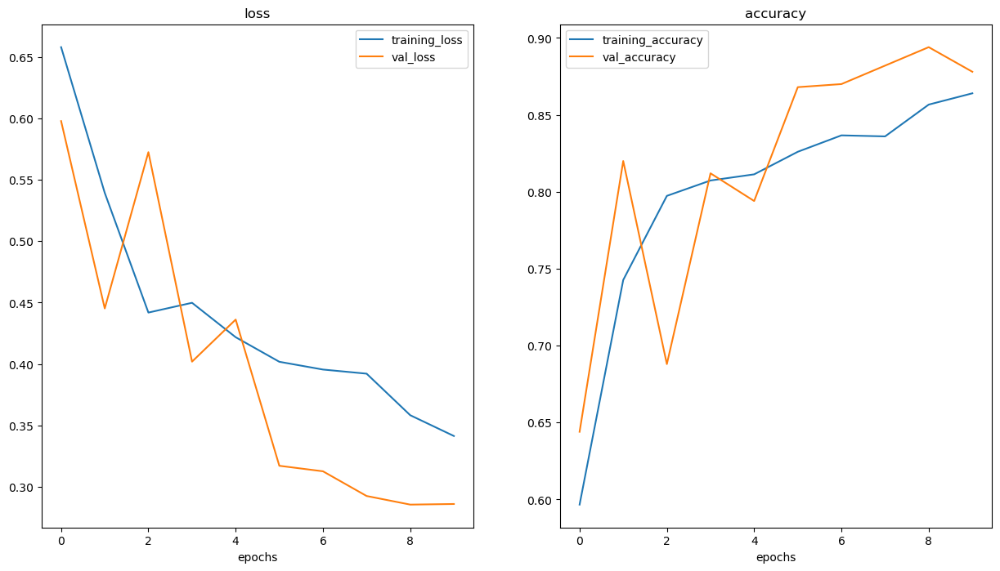

In [50]:
plot_loss_curves(history_practive)

### Using custom data

In [51]:
print(class_names)

['pizza' 'steak']


--2023-05-24 22:37:33--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8000::154, 2606:50c0:8002::154, 2606:50c0:8001::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg.2’

03-steak.jpeg.2     100%[===================>]   1.89M  4.99MB/s    in 0.4s    

2023-05-24 22:37:41 (4.99 MB/s) - ‘03-steak.jpeg.2’ saved [1978213/1978213]



(-0.5, 3023.5, 4031.5, -0.5)

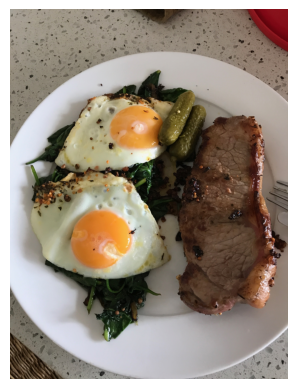

In [52]:
import matplotlib.image as mpimg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
steak = mpimg.imread("03-steak.jpeg")
plt.imshow(steak)
plt.axis(False)

In [53]:
steak.shape,type(steak)

((4032, 3024, 3), numpy.ndarray)

In [54]:
steak_tensor = tf.cast(tf.constant(steak),dtype=tf.float32)
type(steak_tensor),steak_tensor.shape

(tensorflow.python.framework.ops.EagerTensor, TensorShape([4032, 3024, 3]))

In [55]:
# model_practice.predict(tf.expand_dims(tf.reshape(steak_tensor,shape=(224,224)),axis=0))

### Need to resize our test image to match the shape the model has been trained upon

In [56]:
def load_and_prep_image(filename,image_shape=224):
    #Read the image
    img = tf.io.read_file(filename)
    #Decode the read file into tensor
    img = tf.image.decode_image(img)
    #Resize image
    img = tf.image.resize(img,size=[image_shape,image_shape])
    # Rescale the image and get all values between 0 and 1
    img = img/255.
    return img

In [57]:
steak = load_and_prep_image("03-steak.jpeg")
steak,len(steak)

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6377451 , 0.6220588 , 0.57892156],
         [0.6504902 , 0.63186276, 0.5897059 ],
         [0.63186276, 0.60833335, 0.5612745 ],
         ...,
         [0.52156866, 0.05098039, 0.09019608],
         [0.49509802, 0.04215686, 0.07058824],
         [0.52843136, 0.07745098, 0.10490196]],
 
        [[0.6617647 , 0.6460784 , 0.6107843 ],
         [0.6387255 , 0.6230392 , 0.57598037],
         [0.65588236, 0.63235295, 0.5852941 ],
         ...,
         [0.5352941 , 0.06862745, 0.09215686],
         [0.529902  , 0.05931373, 0.09460784],
         [0.5142157 , 0.05539216, 0.08676471]],
 
        [[0.6519608 , 0.6362745 , 0.5892157 ],
         [0.6392157 , 0.6137255 , 0.56764704],
         [0.65637255, 0.6269608 , 0.5828431 ],
         ...,
         [0.53137255, 0.06470589, 0.08039216],
         [0.527451  , 0.06862745, 0.1       ],
         [0.52254903, 0.05196078, 0.0872549 ]],
 
        ...,
 
        [[0.49313724, 0.42745098

In [58]:
pred = model_practice.predict(tf.expand_dims(steak,axis=0))
pred

2023-05-24 22:37:43.304505: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 359ms/step


array([[0.8514516]], dtype=float32)

looks like our custom image os being put through the model

In [59]:
class_names

array(['pizza', 'steak'], dtype='<U5')

In [60]:
# We can index the predicted class by rounding the prediction probabilty
pred_class = class_names[int(tf.round(pred))]
pred_class


'steak'

In [61]:
def pred_and_plot(model,filename,class_names=class_names):
    img=load_and_prep_image(filename)
    pred = model.predict(tf.expand_dims(img,axis=0))
    pred_class = class_names[int(tf.round(pred))]
    plt.imshow(img)
    plt.title(pred_class)
    plt.axis(False)

1/1 [==============================] - 0s 11ms/step


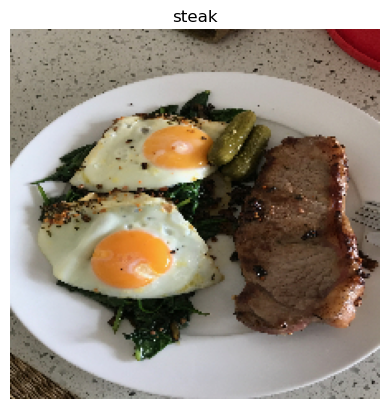

In [62]:
pred_and_plot(model=model_practice,filename="03-steak.jpeg")

In [63]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg

--2023-05-24 22:37:44--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8002::154, 2606:50c0:8001::154, 2606:50c0:8003::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8002::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg.2’

03-pizza-dad.jpeg.2 100%[===================>]   2.74M  5.91MB/s    in 0.5s    

2023-05-24 22:37:45 (5.91 MB/s) - ‘03-pizza-dad.jpeg.2’ saved [2874848/2874848]



In [64]:
model_7.predict(tf.expand_dims(load_and_prep_image("03-pizza-dad.jpeg"),axis=0))

1/1 [==============================] - 0s 100ms/step


2023-05-24 22:37:45.760668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


array([[0.11751074]], dtype=float32)

1/1 [==============================] - 0s 11ms/step


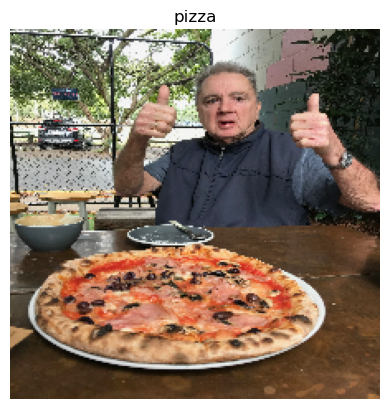

In [65]:
pred_and_plot(model_7,"03-pizza-dad.jpeg")

Train a better model and avoid edge cases ---> 0.511 taken as steak wherein it is pizza

In [66]:
tf.random.set_seed(42)
train_dir="pizza_steak/train/"
test_dir ="pizza_steak/test/"
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary")
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             seed=42,
                                             class_mode="binary")
model_10 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(1,1),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(1,1),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_10.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.00125),
                 metrics=["accuracy"])
history_10 = model_10.fit(train_data,
                          epochs=12,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/12


2023-05-24 22:37:47.085073: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6889 - accuracy: 0.5493

2023-05-24 22:37:53.498375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 9s 161ms/step - loss: 0.6889 - accuracy: 0.5493 - val_loss: 0.6485 - val_accuracy: 0.6940
Epoch 2/12
47/47 [==============================] - 9s 193ms/step - loss: 0.5327 - accuracy: 0.7407 - val_loss: 0.4749 - val_accuracy: 0.8080
Epoch 3/12
47/47 [==============================] - 9s 196ms/step - loss: 0.4905 - accuracy: 0.7713 - val_loss: 0.4064 - val_accuracy: 0.8300
Epoch 4/12
47/47 [==============================] - 9s 189ms/step - loss: 0.4462 - accuracy: 0.8087 - val_loss: 0.3756 - val_accuracy: 0.8520
Epoch 5/12
47/47 [==============================] - 9s 187ms/step - loss: 0.4267 - accuracy: 0.8133 - val_loss: 0.3721 - val_accuracy: 0.8320
Epoch 6/12
47/47 [==============================] - 9s 187ms/step - loss: 0.4199 - accuracy: 0.8153 - val_loss: 0.3840 - val_accuracy: 0.8560
Epoch 7/12
47/47 [==============================] - 9s 188ms/step - loss: 0.4192 - accuracy: 0.8107 - val_loss: 0.3662 - val_accuracy: 0.8560
Epoch 8/12
47/47 

2023-05-24 22:39:35.837596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 391ms/step


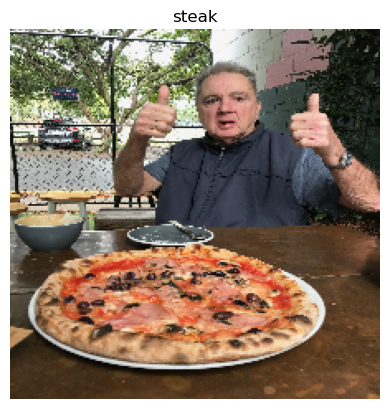

In [67]:
pred_and_plot(model_10,"03-pizza-dad.jpeg")

1/1 [==============================] - 0s 72ms/step


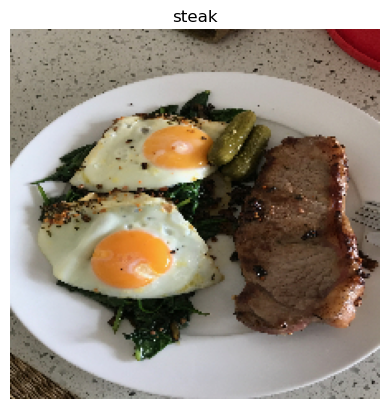

In [68]:
pred_and_plot(model_10,"03-steak.jpeg")

# Multi-class Image Classification Problem
* (10 classes)
1. Preprocess the data
2. Create a model
3. Fit the model
4. Evaluate the model
5. Adjust different hyper-parameters
6. Repeat

In [69]:
import zipfile
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
#unzip the data
zip_ref=zipfile.ZipFile("10_food_classes_all_data.zip","r")
zip_ref.extractall()
zip_ref.close()

--2023-05-24 22:39:36--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 2404:6800:4007:82b::2010, 2404:6800:4007:82c::2010, 2404:6800:4007:810::2010, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4007:82b::2010|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip.2’

10_food_classes_all 100%[===================>] 495.13M  6.69MB/s    in 80s     

2023-05-24 22:41:01 (6.19 MB/s) - ‘10_food_classes_all_data.zip.2’ saved [519183241/519183241]



In [70]:
import os

for dirpath,dirnames,filenames in os.walk("10_food_classes_all_data"):
    print("There are ",len(dirnames)," directories and ",len(filenames)," images in ",dirpath,".")

There are  2  directories and  1  images in  10_food_classes_all_data .
There are  10  directories and  0  images in  10_food_classes_all_data/test .
There are  0  directories and  250  images in  10_food_classes_all_data/test/ice_cream .
There are  0  directories and  250  images in  10_food_classes_all_data/test/chicken_curry .
There are  0  directories and  250  images in  10_food_classes_all_data/test/steak .
There are  0  directories and  250  images in  10_food_classes_all_data/test/sushi .
There are  0  directories and  250  images in  10_food_classes_all_data/test/chicken_wings .
There are  0  directories and  250  images in  10_food_classes_all_data/test/grilled_salmon .
There are  0  directories and  250  images in  10_food_classes_all_data/test/hamburger .
There are  0  directories and  250  images in  10_food_classes_all_data/test/pizza .
There are  0  directories and  250  images in  10_food_classes_all_data/test/ramen .
There are  0  directories and  250  images in  10_fo

In [71]:
# Setup the path
train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

In [72]:
# Lets get the class names
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names=np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


['2468036.jpg']


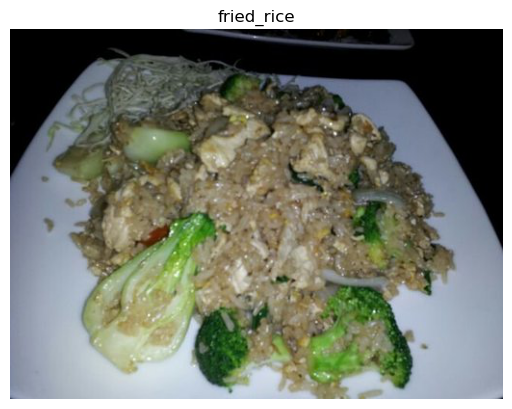

Image shape (384, 512, 3)


In [73]:
# Visualise
import random
img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names))

In [74]:
# preprocess the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Rescale
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="categorical")
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             seed=42,
                                             class_mode="categorical")

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


In [75]:
# Create a model(start with a baseline)

model_11 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])

model_11.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                 metrics=['accuracy'])

history_11 = model_11.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/10


2023-05-24 22:41:10.765519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.1792 - accuracy: 0.1864

2023-05-24 22:41:37.793749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 37s 141ms/step - loss: 2.1792 - accuracy: 0.1864 - val_loss: 2.0485 - val_accuracy: 0.2484
Epoch 2/10
235/235 [==============================] - 334s 1s/step - loss: 1.9689 - accuracy: 0.3088 - val_loss: 1.9417 - val_accuracy: 0.3132
Epoch 3/10
235/235 [==============================] - 360s 2s/step - loss: 1.7577 - accuracy: 0.3969 - val_loss: 1.9074 - val_accuracy: 0.3264
Epoch 4/10
235/235 [==============================] - 331s 1s/step - loss: 1.3346 - accuracy: 0.5524 - val_loss: 2.0663 - val_accuracy: 0.3248
Epoch 5/10
235/235 [==============================] - 30s 125ms/step - loss: 0.7947 - accuracy: 0.7432 - val_loss: 2.6964 - val_accuracy: 0.2948
Epoch 6/10
235/235 [==============================] - 29s 123ms/step - loss: 0.3645 - accuracy: 0.8828 - val_loss: 3.6166 - val_accuracy: 0.2560
Epoch 7/10
235/235 [==============================] - 226s 966ms/step - loss: 0.1406 - accuracy: 0.9580 - val_loss: 4.6219 - val_accuracy: 0.2724
E

In [76]:
# Evaluate the model
model_11.evaluate(test_data)

79/79 [==============================] - 304s 4s/step - loss: 7.0361 - accuracy: 0.2536


[7.036136150360107, 0.25360000133514404]

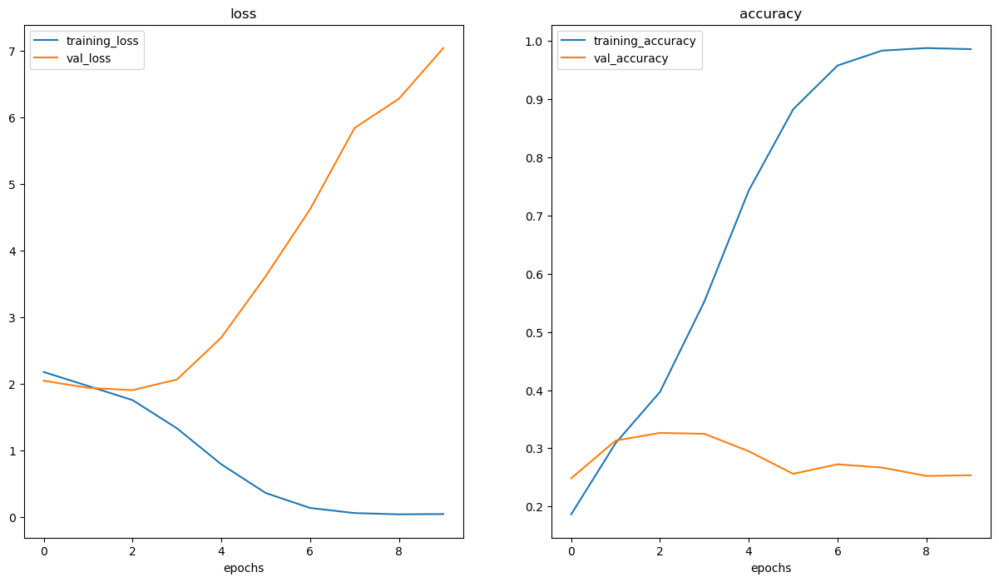

In [77]:
plot_loss_curves(history_11)

From the above loss curves, we can see that the model is overfitting, i.e., great results on training data and poor results on test dataset

### Adjust the model hyper-parameters to beat the basline(overfitting)

In [78]:
model_12 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])

model_12.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                 metrics=['accuracy'])

history_12 = model_12.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/10


2023-05-24 23:10:11.723766: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2765 - accuracy: 0.2015

2023-05-24 23:10:28.391359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 22s 93ms/step - loss: 2.2765 - accuracy: 0.2015 - val_loss: 2.0509 - val_accuracy: 0.2592
Epoch 2/10
235/235 [==============================] - 131s 560ms/step - loss: 1.9238 - accuracy: 0.3328 - val_loss: 1.9446 - val_accuracy: 0.3032
Epoch 3/10
235/235 [==============================] - 23s 96ms/step - loss: 1.6861 - accuracy: 0.4307 - val_loss: 1.9519 - val_accuracy: 0.3196
Epoch 4/10
 67/235 [=======>......................] - ETA: 12s - loss: 1.2851 - accuracy: 0.5871

KeyboardInterrupt: 

In [ ]:
model_11.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_61 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_62 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 110, 110, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_63 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_64 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 53, 53, 10)       0         
 g2D)                                                

**Prevent overfitting:**
* Get more data
* Simplify the model - reduce the layers and reduce the complexity of the layers
* Use data augmentation
* Use transfer learning

In [ ]:
# Reduce the number of layers - 2 Conv2D layers
model_12 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_12.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=['accuracy'])
history_12 = model_12.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-05-22 19:16:00.149184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.1170 - accuracy: 0.2315

2023-05-22 19:16:27.770008: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 36s 152ms/step - loss: 2.1170 - accuracy: 0.2315 - val_loss: 1.9787 - val_accuracy: 0.2996
Epoch 2/5
235/235 [==============================] - 36s 151ms/step - loss: 1.7685 - accuracy: 0.4000 - val_loss: 1.9203 - val_accuracy: 0.3352
Epoch 3/5
235/235 [==============================] - 36s 151ms/step - loss: 1.3943 - accuracy: 0.5495 - val_loss: 2.0338 - val_accuracy: 0.3240
Epoch 4/5
235/235 [==============================] - 36s 153ms/step - loss: 0.9098 - accuracy: 0.7183 - val_loss: 2.2826 - val_accuracy: 0.3052
Epoch 5/5
235/235 [==============================] - 35s 149ms/step - loss: 0.5147 - accuracy: 0.8607 - val_loss: 2.5602 - val_accuracy: 0.2988


In [ ]:
model_12.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_67 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_38 (MaxPoolin  (None, 111, 111, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                            
                                                                 
 flatten_14 (Flatten)        (None, 29160)             0         
                                                                 
 dense_19 (Dense)            (None, 10)              

(None, None)

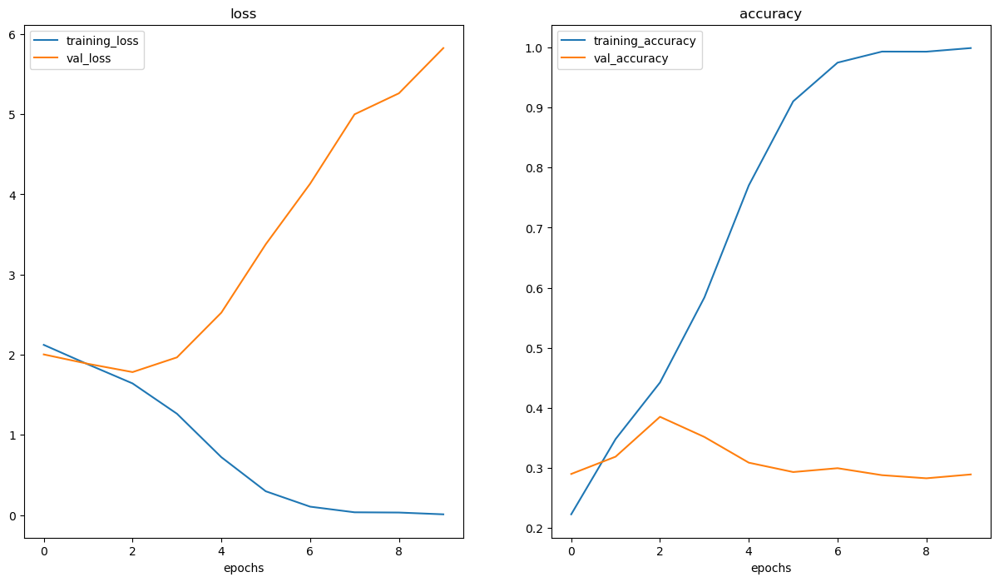

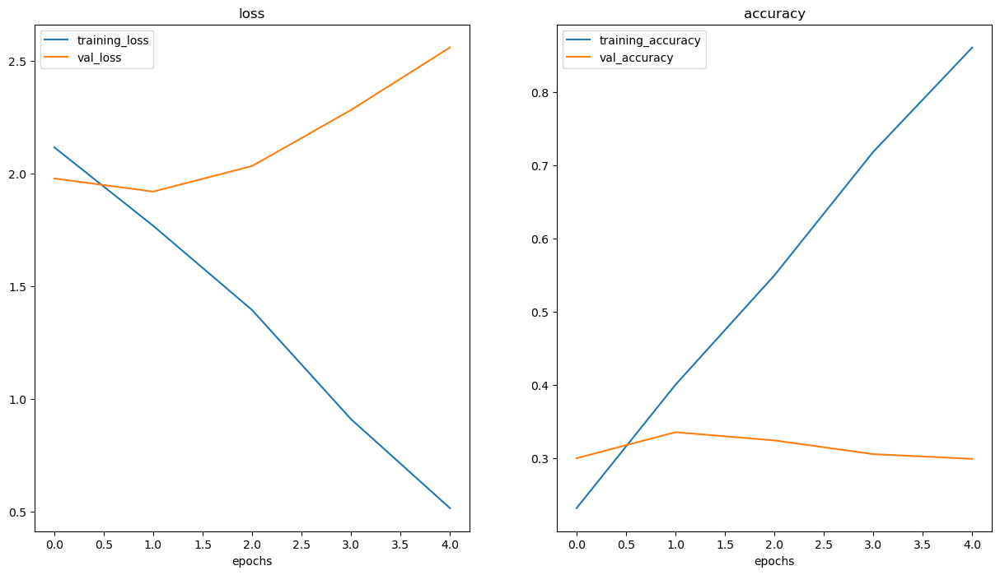

In [ ]:
plot_loss_curves(history_11),plot_loss_curves(history_12)

* ### Try using Data augmentation

In [ ]:
tf.random.set_seed(42)

train_dir="10_food_classes_all_data/train/"
test_dir="10_food_classes_all_data/test/"

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             shear_range=0.2,
                                             width_shift_range=0.3,
                                             height_shift_range=0.2,
                                             vertical_flip=True,
                                             horizontal_flip=True,
                                             rotation_range=0.12)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                               target_size=(224,224),
                                                               batch_size=32,
                                                               class_mode="categorical",
                                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             class_mode="categorical",
                                             shuffle=True)

model_13 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_13.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                 metrics=['accuracy'])
history_13 = model_13.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/5


2023-05-22 19:19:01.415815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2172 - accuracy: 0.1865

2023-05-22 19:20:21.670990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 88s 374ms/step - loss: 2.2172 - accuracy: 0.1865 - val_loss: 2.0664 - val_accuracy: 0.2796
Epoch 2/5
235/235 [==============================] - 87s 371ms/step - loss: 2.1087 - accuracy: 0.2421 - val_loss: 1.9452 - val_accuracy: 0.3228
Epoch 3/5
219/235 [==========================>...] - ETA: 5s - loss: 2.0581 - accuracy: 0.2726

In [ ]:
model_13.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 111, 111, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_70 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_41 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 29160)             0         
                                                                 
 dense_20 (Dense)            (None, 10)              

Time per epoch is taking longer beccause the data is being augmeted on the fly and the original data is not being altered at the path

In [ ]:
model_13_1 = tf.keras.models.clone_model(model_12)
model_13_1.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                  metrics=['accuracy'])
history_13_1 = model_13_1.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-04-21 07:38:08.182986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2404 - accuracy: 0.1711

2023-04-21 07:39:07.606440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 65s 276ms/step - loss: 2.2404 - accuracy: 0.1711 - val_loss: 2.0862 - val_accuracy: 0.2344
Epoch 2/5
235/235 [==============================] - 72s 308ms/step - loss: 2.1223 - accuracy: 0.2368 - val_loss: 1.9651 - val_accuracy: 0.3064
Epoch 3/5
235/235 [==============================] - 68s 290ms/step - loss: 2.0575 - accuracy: 0.2737 - val_loss: 1.9193 - val_accuracy: 0.3364
Epoch 4/5
235/235 [==============================] - 64s 272ms/step - loss: 2.0262 - accuracy: 0.2861 - val_loss: 1.9321 - val_accuracy: 0.3272
Epoch 5/5
235/235 [==============================] - 63s 269ms/step - loss: 2.0035 - accuracy: 0.3024 - val_loss: 1.8389 - val_accuracy: 0.3656


In [ ]:
model_13.evaluate(test_data)

79/79 [==============================] - 5s 67ms/step - loss: 1.7929 - accuracy: 0.3852


[1.7929308414459229, 0.38519999384880066]

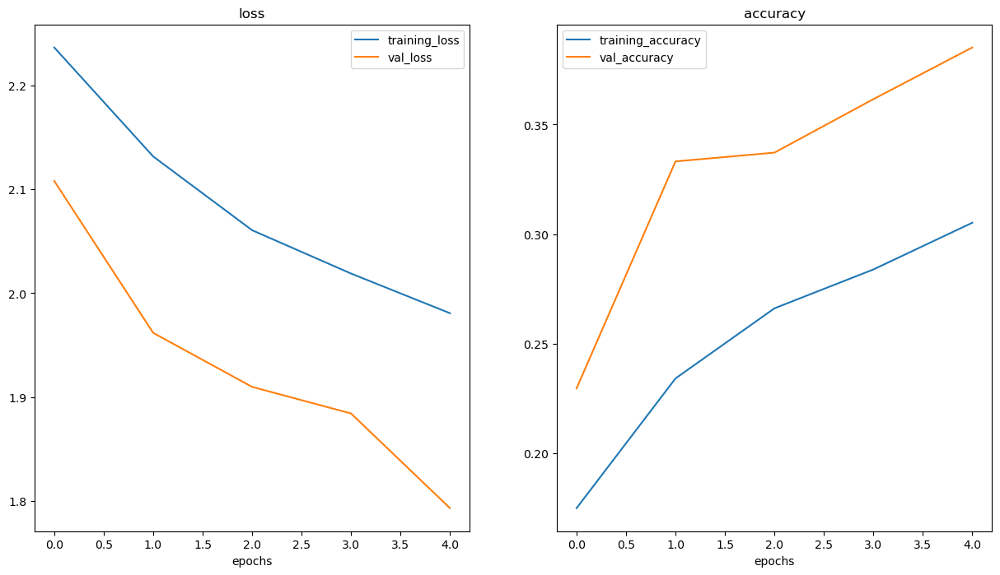

In [ ]:
plot_loss_curves(history_13)

### Make predictions

In [ ]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [ ]:
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-sushi.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg

In [ ]:
# Make a prediction
pred_and_plot(model_13,"03-pizza-dad.jpeg",class_names)
pred_and_plot(model_13,"03-hamburger.jpeg",class_names)
pred_and_plot(model_13,"03-steak.jpeg",class_names)
pred_and_plot(model_13,"03-sushi.jpeg",class_names)

1/1 [==============================] - 0s 78ms/step


2023-04-21 07:43:47.119662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


TypeError: only size-1 arrays can be converted to Python scalars

In [ ]:
pred = model_13.predict(tf.expand_dims(load_and_prep_image("03-pizza-dad.jpeg"),axis=0))
pred

1/1 [==============================] - 0s 12ms/step


array([[0.03124154, 0.06481832, 0.07027296, 0.05267696, 0.07044587,
        0.06023644, 0.047419  , 0.2835268 , 0.06388137, 0.25548077]],
      dtype=float32)

In [ ]:
def pred_and_plot(model,filename,class_names=class_names):
    img=load_and_prep_image(filename)
    pred = model.predict(tf.expand_dims(img,axis=0))

    if(len(pred[0])>1):
        pred_class=class_names[tf.argmax(pred[0])]
    else:
        pred_class = class_names[int(tf.round(pred[0]))]
    plt.imshow(img)
    plt.title(pred_class)
    plt.axis(False)
    plt.show()

1/1 [==============================] - 0s 44ms/step


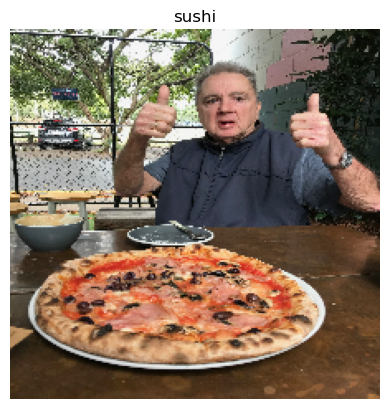

2023-04-21 07:53:59.710341: W tensorflow/core/framework/op_kernel.cc:1745] OP_REQUIRES failed at whole_file_read_ops.cc:116 : NOT_FOUND: 03-hamburger.jpeg; No such file or directory


NotFoundError: 03-hamburger.jpeg; No such file or directory [Op:ReadFile]

In [ ]:
# Make a prediction
pred_and_plot(model_13,"03-pizza-dad.jpeg",class_names)
pred_and_plot(model_13,"03-hamburger.jpeg",class_names)
pred_and_plot(model_13,"03-steak.jpeg",class_names)
pred_and_plot(model_13,"03-sushi.jpeg",class_names)

#### Repeat until imporved:
1. restruct the model's architecture - increase layers nad hidden units
2. Adjust learning rate
3. hyper-parameters/data augmentation
4. training for longer
5. Transfer learning

In [ ]:
tf.random.set_seed(42)

train_dir="10_food_classes_all_data/train/"
test_dir="10_food_classes_all_data/test/"

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             shear_range=0.2,
                                             width_shift_range=0.3,
                                             height_shift_range=0.2,
                                             vertical_flip=True,
                                             horizontal_flip=True,
                                             rotation_range=0.12)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                               target_size=(224,224),
                                                               batch_size=32,
                                                               class_mode="categorical",
                                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             class_mode="categorical",
                                             shuffle=True)

model_14 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=1,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_14.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                 metrics=['accuracy'])
history_14 = model_14.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/5


2023-04-21 07:58:32.841493: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2803 - accuracy: 0.1940

2023-04-21 07:59:29.921466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 64s 268ms/step - loss: 2.2803 - accuracy: 0.1940 - val_loss: 2.0843 - val_accuracy: 0.2384
Epoch 2/5
235/235 [==============================] - 63s 268ms/step - loss: 2.1206 - accuracy: 0.2452 - val_loss: 2.0048 - val_accuracy: 0.2868
Epoch 3/5
235/235 [==============================] - 63s 268ms/step - loss: 2.0976 - accuracy: 0.2555 - val_loss: 2.0140 - val_accuracy: 0.2960
Epoch 4/5
235/235 [==============================] - 63s 267ms/step - loss: 2.0770 - accuracy: 0.2657 - val_loss: 1.9670 - val_accuracy: 0.2992
Epoch 5/5
235/235 [==============================] - 67s 283ms/step - loss: 2.0634 - accuracy: 0.2777 - val_loss: 1.9389 - val_accuracy: 0.3108


# EXERCISE

In [ ]:
# 1. Find an ideal learning rate for a simple convolutional neural network model on the 10 class dataset.

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.25,
                                             width_shift_range=0.25,
                                             height_shift_range=0.25,
                                             horizontal_flip=True,
                                             vertical_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   seed=42,
                                                                   batch_size=32,
                                                                   target_size=(224,224),
                                                                   class_mode="categorical")
test_data = test_datagen.flow_from_directory(test_dir,
                                             seed=42,
                                             batch_size=32,
                                             target_size=(224,224),
                                             class_mode="categorical")

from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy

model_exercise = tf.keras.models.Sequential([
    Conv2D(filters=10,
           kernel_size=3,
           input_shape=(224,224,3),
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=10,
           kernel_size=3,
           input_shape=(224,224,3),
           activation=relu),
    MaxPool2D(pool_size=2),
    Flatten(),
    Dense(10,activation=softmax)
])

model_exercise.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=["accuracy"])

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch:1e-3*10**(epoch/20))

history_exercise = model_exercise.fit(train_data_augmented,
                                      epochs=20,
                                      steps_per_epoch=len(train_data),
                                      validation_data=test_data,
                                      validation_steps=len(test_data),
                                      callbacks=[lr_scheduler])

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/20


2023-04-21 08:05:56.451131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2165 - accuracy: 0.1869

2023-04-21 08:06:54.259255: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 64s 268ms/step - loss: 2.2165 - accuracy: 0.1869 - val_loss: 2.0395 - val_accuracy: 0.2800 - lr: 0.0010
Epoch 2/20
235/235 [==============================] - 62s 265ms/step - loss: 2.0875 - accuracy: 0.2631 - val_loss: 1.9306 - val_accuracy: 0.3296 - lr: 0.0011
Epoch 3/20
235/235 [==============================] - 62s 265ms/step - loss: 2.0453 - accuracy: 0.2803 - val_loss: 1.8911 - val_accuracy: 0.3536 - lr: 0.0013
Epoch 4/20
235/235 [==============================] - 62s 262ms/step - loss: 2.0132 - accuracy: 0.3025 - val_loss: 1.8227 - val_accuracy: 0.3736 - lr: 0.0014
Epoch 5/20
235/235 [==============================] - 62s 265ms/step - loss: 1.9968 - accuracy: 0.3059 - val_loss: 1.8316 - val_accuracy: 0.3616 - lr: 0.0016
Epoch 6/20
235/235 [==============================] - 63s 267ms/step - loss: 1.9858 - accuracy: 0.3113 - val_loss: 1.8091 - val_accuracy: 0.3852 - lr: 0.0018
Epoch 7/20
235/235 [==============================] - 63s 267ms

In [ ]:
lsr = 1e-3*(10**(tf.range(20)/20))
lsr

<tf.Tensor: shape=(20,), dtype=float64, numpy=
array([0.001     , 0.00112202, 0.00125893, 0.00141254, 0.00158489,
       0.00177828, 0.00199526, 0.00223872, 0.00251189, 0.00281838,
       0.00316228, 0.00354813, 0.00398107, 0.00446684, 0.00501187,
       0.00562341, 0.00630957, 0.00707946, 0.00794328, 0.00891251])>

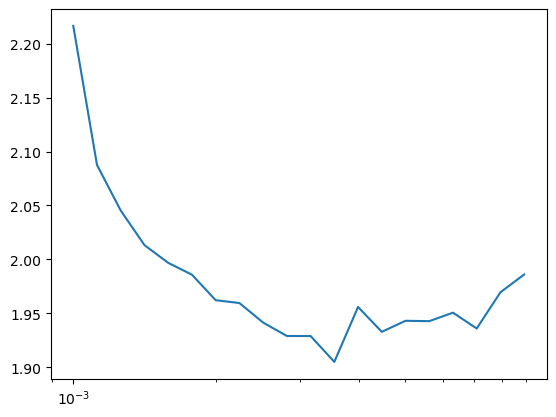

In [ ]:
import matplotlib.pyplot as plt
plt.semilogx(lsr,history_exercise.history["loss"])

In [ ]:
history_exercise.history

{'loss': [2.2165379524230957,
  2.0874972343444824,
  2.045259714126587,
  2.013174057006836,
  1.9967516660690308,
  1.9857503175735474,
  1.9621069431304932,
  1.9594718217849731,
  1.941353678703308,
  1.9288946390151978,
  1.928858757019043,
  1.9048817157745361,
  1.9558101892471313,
  1.9327548742294312,
  1.9430043697357178,
  1.9426506757736206,
  1.9505181312561035,
  1.9358456134796143,
  1.9694608449935913,
  1.9859504699707031],
 'accuracy': [0.18693333864212036,
  0.26306667923927307,
  0.280266672372818,
  0.3025333285331726,
  0.30586665868759155,
  0.3113333284854889,
  0.3163999915122986,
  0.3194666802883148,
  0.33133333921432495,
  0.3362666666507721,
  0.33346667885780334,
  0.3467999994754791,
  0.3233333230018616,
  0.33933332562446594,
  0.329066663980484,
  0.32946667075157166,
  0.3237333297729492,
  0.3306666612625122,
  0.31520000100135803,
  0.31413334608078003],
 'val_loss': [2.039503574371338,
  1.9306257963180542,
  1.8911038637161255,
  1.82274818420410

In [ ]:
ideal_lr = lsr[tf.argmax(history_exercise.history["val_loss"]).numpy()]
ideal_lr.numpy()

0.001

In [ ]:
model_exercise_2 = tf.keras.models.clone_model(model_exercise)
model_exercise_2.compile(loss=CategoricalCrossentropy(),
                         optimizer=Adam(learning_rate=ideal_lr.numpy()),
                         metrics=['accuracy'])
model_exercise_2.fit(train_data_augmented,
                     epochs=10,
                     steps_per_epoch=len(train_data),
                     validation_data=test_data,
                     validation_steps=len(test_data))

Epoch 1/10


2023-04-21 08:27:04.450216: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2353 - accuracy: 0.1809

2023-04-21 08:28:03.491155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 65s 274ms/step - loss: 2.2353 - accuracy: 0.1809 - val_loss: 2.0973 - val_accuracy: 0.2364
Epoch 2/10
235/235 [==============================] - 64s 272ms/step - loss: 2.1375 - accuracy: 0.2252 - val_loss: 1.9924 - val_accuracy: 0.2892
Epoch 3/10
235/235 [==============================] - 64s 271ms/step - loss: 2.0991 - accuracy: 0.2464 - val_loss: 1.9701 - val_accuracy: 0.3044
Epoch 4/10
235/235 [==============================] - 69s 294ms/step - loss: 2.0580 - accuracy: 0.2784 - val_loss: 1.9155 - val_accuracy: 0.3104
Epoch 5/10
235/235 [==============================] - 68s 287ms/step - loss: 2.0558 - accuracy: 0.2717 - val_loss: 1.8927 - val_accuracy: 0.3340
Epoch 6/10
235/235 [==============================] - 66s 282ms/step - loss: 2.0222 - accuracy: 0.2871 - val_loss: 1.9525 - val_accuracy: 0.3212
Epoch 7/10
235/235 [==============================] - 63s 270ms/step - loss: 2.0013 - accuracy: 0.3001 - val_loss: 1.8839 - val_accuracy: 0.3

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/15


2023-04-21 08:37:54.739799: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.3046 - accuracy: 0.0996

2023-04-21 08:39:02.478742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 75s 315ms/step - loss: 2.3046 - accuracy: 0.0996 - val_loss: 2.2882 - val_accuracy: 0.1328 - lr: 0.0010
Epoch 2/15
235/235 [==============================] - 76s 325ms/step - loss: 2.2733 - accuracy: 0.1481 - val_loss: 2.2074 - val_accuracy: 0.1848 - lr: 0.0011
Epoch 3/15
235/235 [==============================] - 76s 324ms/step - loss: 2.2318 - accuracy: 0.1659 - val_loss: 2.1217 - val_accuracy: 0.2340 - lr: 0.0012
Epoch 4/15
235/235 [==============================] - 78s 330ms/step - loss: 2.1598 - accuracy: 0.2180 - val_loss: 1.9808 - val_accuracy: 0.2900 - lr: 0.0013
Epoch 5/15
235/235 [==============================] - 80s 341ms/step - loss: 2.1234 - accuracy: 0.2360 - val_loss: 1.9498 - val_accuracy: 0.3152 - lr: 0.0014
Epoch 6/15
235/235 [==============================] - 161s 686ms/step - loss: 2.0923 - accuracy: 0.2492 - val_loss: 1.9378 - val_accuracy: 0.3216 - lr: 0.0015
Epoch 7/15
235/235 [==============================] - 67s 286m

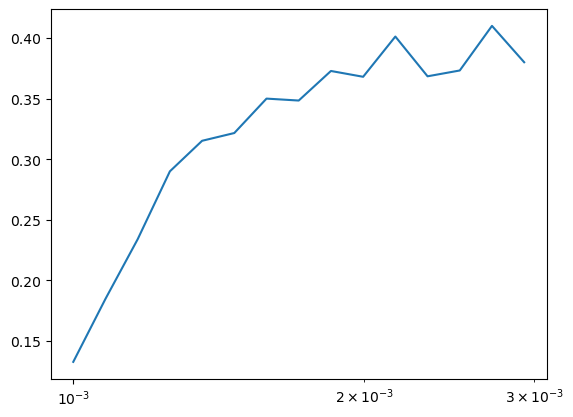

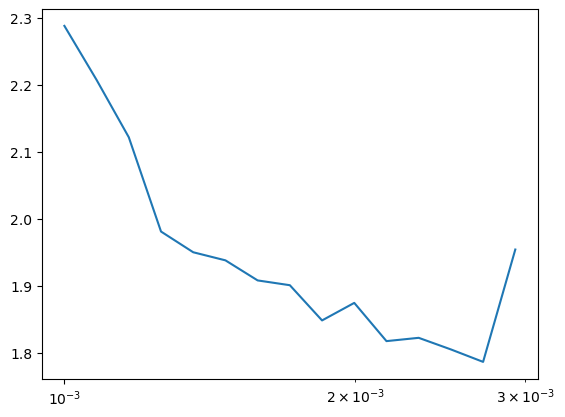

Epoch 1/15


2023-04-21 08:59:31.024779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2966 - accuracy: 0.1147

2023-04-21 09:00:39.793492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 76s 319ms/step - loss: 2.2966 - accuracy: 0.1147 - val_loss: 2.3030 - val_accuracy: 0.1000
Epoch 2/15
235/235 [==============================] - 81s 346ms/step - loss: 2.3034 - accuracy: 0.0967 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/15
235/235 [==============================] - 87s 371ms/step - loss: 2.3031 - accuracy: 0.0911 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/15
235/235 [==============================] - 80s 341ms/step - loss: 2.3032 - accuracy: 0.0923 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/15
235/235 [==============================] - 79s 337ms/step - loss: 2.3031 - accuracy: 0.0917 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/15
235/235 [==============================] - 81s 346ms/step - loss: 2.3031 - accuracy: 0.0939 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/15
235/235 [==============================] - 81s 342ms/step - loss: 2.3032 - accuracy: 0.0963 - val_loss: 2.3026 - val_accuracy: 0.1

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.models import Sequential
#from tensorflow.keras.callbacks import LearningRateScheduler
import matplotlib.pyplot as plt

tf.random.set_seed(42)

train_dir = "10_food_classes_all_data/train"
test_dir = "10_food_classes_all_data/test"

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.3,
                                             width_shift_range=0.3,
                                             height_shift_range=0.3,
                                             vertical_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                               seed=42,
                                               target_size=(224,224),
                                               batch_size=32,
                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             seed=42,
                                             target_size=(224,224),
                                             batch_size=32,
                                             shuffle=True)

model_exercise_final = Sequential([
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu,
           input_shape=(224,224,3)),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Flatten(),
    Dense(10,activation=softmax)
])

model_exercise_final.compile(loss=CategoricalCrossentropy(),
                             optimizer=Adam(),
                             metrics=['accuracy'])

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch:1e-3*10**(epoch/30))

history_exercise_final = model_exercise_final.fit(train_data_augmented,
                                                  epochs=15,
                                                  steps_per_epoch=len(train_data_augmented),
                                                  validation_data=test_data,
                                                  validation_steps=len(test_data),
                                                  callbacks=[lr_scheduler])

lrs = 1e-3*10**(tf.range(15)/30)
plt.semilogx(history_exercise_final.history["lr"],history_exercise_final.history["val_accuracy"])
plt.show()
plt.semilogx(history_exercise_final.history["lr"],history_exercise_final.history["val_loss"])
plt.show()

ideal_lr = history_exercise_final.history["lr"][tf.argmax(history_exercise_final.history["val_accuracy"])]

model_exercise_final_test = tf.keras.models.clone_model(model_exercise_final)
model_exercise_final_test.compile(loss=CategoricalCrossentropy(),
                             optimizer=Adam(learning_rate=ideal_lr),
                             metrics=['accuracy'])

history_exercise_final_test = model_exercise_final_test.fit(train_data_augmented,
                                                  epochs=15,
                                                  steps_per_epoch=len(train_data_augmented),
                                                  validation_data=test_data,
                                                  validation_steps=len(test_data))

In [ ]:
model_exercise_final_test.evaluate(test_data)

79/79 [==============================] - 7s 93ms/step - loss: 2.3026 - accuracy: 0.1000


[2.302614450454712, 0.10000000149011612]

In [ ]:
model_exercise_final_test.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 223, 223, 20)      260       
                                                                 
 conv2d_76 (Conv2D)          (None, 222, 222, 20)      1620      
                                                                 
 max_pooling2d_46 (MaxPoolin  (None, 111, 111, 20)     0         
 g2D)                                                            
                                                                 
 conv2d_77 (Conv2D)          (None, 110, 110, 20)      1620      
                                                                 
 conv2d_78 (Conv2D)          (None, 109, 109, 20)      1620      
                                                                 
 max_pooling2d_47 (MaxPoolin  (None, 54, 54, 20)       0         
 g2D)                                                

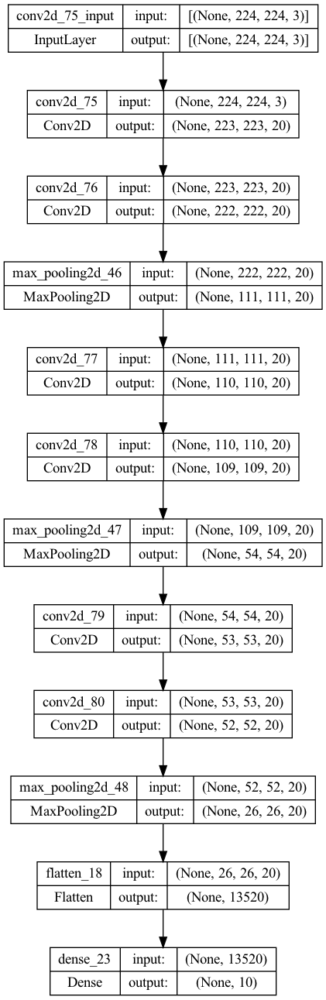

In [ ]:
tf.keras.utils.plot_model(model_exercise_final_test,show_shapes=True)